# Project ARI3129 - Dataset Visualization *(Jupyter Notebook #1)*
---

**Name:** Andrea Filiberto Lucas  
**ID No:** 0279704L

---

## Importing Necessary Libraries

In [7]:
import os
import subprocess
import shutil

# Constants for colored output
COLORS = {
    "green": "\033[92m",  # Green text
    "red": "\033[91m",    # Red text
    "reset": "\033[0m"    # Reset to default color
}

# Define the path to the Versions folder and the target subfolder
versions_path = os.path.abspath(os.path.join("..", "Versions"))
target_subfolder = os.path.join(versions_path, "MDD-AFL-Yolov8")

# Check if the Versions folder exists, if not, create it
if not os.path.exists(versions_path):
    os.makedirs(versions_path)
    print(f"[{COLORS['green']}✔{COLORS['reset']}] Folder created at: {versions_path}")

# Check if the MDD-AFL-Yolov8 subfolder exists
if os.path.exists(target_subfolder):
    print(f"[{COLORS['green']}✔{COLORS['reset']}] The subfolder '{target_subfolder}' already exists. Skipping download!")
else:
    # Check if roboflow is installed
    if importlib.util.find_spec("roboflow") is not None:                                                                                # type: ignore
        print(f"[{COLORS['green']}✔{COLORS['reset']}] Roboflow is already installed!")
    else:
        # Install roboflow using pip
        try:
            subprocess.check_call(["pip", "install", "roboflow"])
            print(f"[{COLORS['green']}✔{COLORS['reset']}] Roboflow successfully installed!")
        except subprocess.CalledProcessError as e:
            print(f"[{COLORS['red']}✖{COLORS['reset']}]Failed to install Roboflow. Please check your setup.")
            raise e

    # Import and use Roboflow
    from roboflow import Roboflow

    # Prompt the user for their API key
    print("Please enter your Roboflow API key to download the dataset...")
    api_key = input("Please enter your Roboflow API key: ")

    # Initialize Roboflow with the provided API key
    rf = Roboflow(api_key=api_key)

    # Retrieve project and version
    project = rf.workspace("advanced-cv").project("maltese-domestic-dataset")
    version = project.version(1)

    # Download the dataset
    dataset = version.download("yolov8")

    current_folder = os.getcwd()  # Get the current working directory
    original_folder = os.path.join(current_folder, "Maltese-Domestic-Dataset--1")
    renamed_folder = os.path.join(current_folder, "MDD-AFL-Yolov8")
    target_folder = os.path.join(versions_path, "MDD-AFL-Yolov8")

    # Check if the original folder exists
    if os.path.exists(original_folder):
        # Rename the folder
        os.rename(original_folder, renamed_folder)

        # Move the renamed folder to ../Versions/
        shutil.move(renamed_folder, target_folder)
        print(f"[{COLORS['green']}✔{COLORS['reset']}] Folder downloaded to: {target_folder}")
    else:
        print(f"[{COLORS['red']}✖{COLORS['reset']}]Folder '{original_folder}' does not exist. No action taken.")


[✔] The subfolder '/Users/afl/Documents/University/Year 3/Lectures/SEM1/Advanced CV/Assignments/ARI3129-MDD/Versions/MDD-AFL-Yolov8' already exists. Skipping download!


## Automated Library Installer in Python

This script automates checking and installing libraries from a JSON file. It verifies installations, installs missing libraries via `pip`, and provides clear, colored output for success or errors. With built-in error handling and preloaded common libraries, it simplifies dependency management in Python projects.

In [5]:
import json
import importlib.util

# Path to the JSON file
lib_file_path = os.path.join("..", "Libraries", "Task1_Lib.json")

# Read the libraries from the JSON file
try:
    with open(lib_file_path, 'r') as file:
        libraries = json.load(file)
except FileNotFoundError:
    print(f"{COLORS['red']}Error: Library file not found at {lib_file_path}{COLORS['reset']}")
    exit(1)
except json.JSONDecodeError:
    print(f"{COLORS['red']}Error: Failed to decode JSON from the library file.{COLORS['reset']}")
    exit(1)

# Function to check and install libraries
def check_and_install_libraries(libraries):
    for lib, import_name in libraries.items():
        # Check if the library is installed by checking its module spec
        if importlib.util.find_spec(import_name) is not None:
            print(f"[{COLORS['green']}✔{COLORS['reset']}] Library '{lib}' is already installed.")
        else:
            # If the library is not found, try to install it
            print(f"[{COLORS['red']}✖{COLORS['reset']}] Library '{lib}' is not installed. Installing...")
            try:
                subprocess.check_call(["pip", "install", lib])
                print(f"[{COLORS['green']}✔{COLORS['reset']}] Successfully installed '{lib}'.")
            except subprocess.CalledProcessError:
                print(f"[{COLORS['red']}✖{COLORS['reset']}] Failed to install '{lib}'. Please install it manually.")


# Execute the function to check and install libraries
check_and_install_libraries(libraries)

# Import necessary libraries 
import cv2
import time
import random
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.patches as patches
import concurrent.futures
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

[✔] Library 'opencv-python' is already installed.
[✔] Library 'matplotlib' is already installed.
[✔] Library 'tqdm' is already installed.


## YOLO Dataset Setup Script

This script manages image and label paths for a YOLO dataset. It defines dataset constants like root path, class names, and data splits (`train`, `valid`, `test`). The `get_image_and_label_paths` function validates split names, checks directory existence, and pairs image files with their corresponding labels. Missing labels trigger warnings, ensuring the dataset is properly structured for training and evaluation.


In [6]:
# Define constants
DATASET_ROOT = "../Versions/MDD-AFL-Yolov8"  # Path to the root folder of your YOLO dataset
CLASSES = ["Mixed Waste", "Organic Waste", "Other Waste", "Recyclable Material"]  # List of class names
SPLITS = ["train", "valid", "test"]  # Subdirectories for dataset splits

def get_image_and_label_paths(split):
    # Validate the split name
    if split not in SPLITS:
        raise ValueError(f"Invalid split name: '{split}'. Must be one of {SPLITS}.")

    # Define directories for images and labels
    images_dir = os.path.join(DATASET_ROOT, split, "images")
    labels_dir = os.path.join(DATASET_ROOT, split, "labels")

    # Verify the directories exist
    if not os.path.isdir(images_dir):
        raise FileNotFoundError(f"Images directory not found: {images_dir}")
    if not os.path.isdir(labels_dir):
        raise FileNotFoundError(f"Labels directory not found: {labels_dir}")

    # Collect image and label paths
    image_label_pairs = []
    for file_name in os.listdir(images_dir):
        # Validate file extension
        if file_name.lower().endswith((".jpg", ".jpeg", ".png")):
            image_path = os.path.join(images_dir, file_name)
            
            # Construct the corresponding label path
            label_file = os.path.splitext(file_name)[0] + ".txt"
            label_path = os.path.join(labels_dir, label_file)

            # Append pair if label exists
            if os.path.exists(label_path):
                image_label_pairs.append((image_path, label_path))
            else:
                print(f"Warning: Label file not found for {image_path}")

    # Return the collected pairs
    return image_label_pairs

## Visualization of Dataset
### Dataset Visualization Function

This script visualizes random images from a YOLO dataset split (default: `train`). It fetches image-label pairs, processes the images to include RGB conversion and class labels, and displays them in a grid layout. Image sampling and processing are parallelized for efficiency, and missing labels or errors are handled gracefully. The function provides a quick visual overview of the dataset's content and labeling.

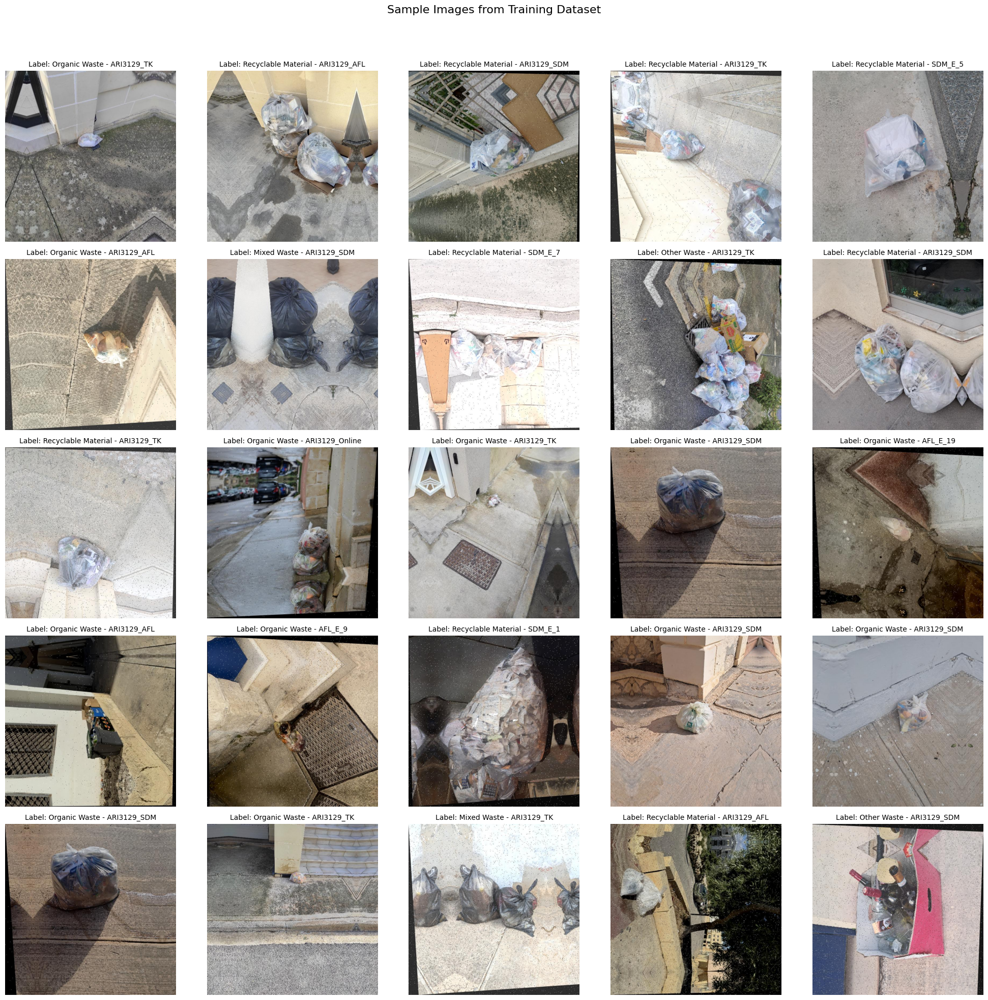

In [3]:
# Function to visualize random images from the dataset
def visualize_random_images(split="train", num_images=25):
    try:
        # Get image-label paths for the specified split
        files = get_image_and_label_paths(split)
        if not files:
            print(f"No files found in split: '{split}'.")
            return

        # Randomly sample the specified number of files
        num_images = min(num_images, len(files))
        random_files = random.sample(files, num_images)
    except Exception as e:
        print(f"Error fetching files for split '{split}': {e}")
        return

    # Function to load and process an image
    def process_image(file_pair):
        img_path, lbl_path = file_pair
        try:
            # Read and convert the image
            bgr_img = cv2.imread(img_path)
            if bgr_img is None:
                return None, "Image not found", None

            rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
            label = "No Label"
            
            # Read the label
            if os.path.exists(lbl_path):
                with open(lbl_path, "r") as f:
                    label_lines = f.readlines()
                if label_lines:
                    class_id = int(label_lines[0].strip().split()[0])
                    label = CLASSES[class_id] if class_id < len(CLASSES) else "Unknown"

            # Extract AFL_E, SDM_E, Online_Number, or fallback to default naming
            file_name = os.path.basename(img_path)
            if "AFL_E" in file_name or "SDM_E" in file_name:
                parts = file_name.split("_")
                idx = [i for i, part in enumerate(parts) if part in {"AFL", "SDM"}]
                if idx and len(parts) > idx[0] + 2:
                    clean_name = f"{parts[idx[0]]}_{parts[idx[0] + 1]}_{parts[idx[0] + 2]}"
                else:
                    clean_name = "Unknown"
            elif "Online" in file_name:
                parts = file_name.split("_")
                clean_name = f"{parts[0]}_{parts[1]}"
            elif "AFL" in file_name or "SDM" in file_name or "TK" in file_name:
                parts = file_name.split("_")
                clean_name = f"{parts[0]}_{parts[1]}"
            else:
                clean_name = file_name

            return rgb_img, f"Label: {label} - {clean_name}", None
        except Exception as e:
            return None, "Error", str(e)

    # Use ThreadPoolExecutor to process images in parallel
    with ThreadPoolExecutor() as executor:
        results = list(executor.map(process_image, random_files))

    # Define the grid size
    grid_size = int(num_images ** 0.5)
    fig, axs = plt.subplots(grid_size, grid_size, figsize=(20, 20))
    axs = axs.flatten()

    for idx, (result, ax) in enumerate(zip(results, axs)):
        rgb_img, title, error = result
        if rgb_img is not None:
            ax.imshow(rgb_img)
            ax.axis("off")
            ax.set_title(title, fontsize=10)
        else:
            ax.axis("off")
            ax.set_title(title, fontsize=10)
            if error:
                print(f"Error processing image: {error}")

    # Hide unused subplots
    for ax in axs[len(results):]:
        ax.axis("off")

    # Add an overall title for the grid
    plt.suptitle("Sample Images from Training Dataset", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

visualize_random_images(split="train", num_images=25)

### Visualizing YOLO Bounding Boxes

This script visualizes images with YOLO bounding boxes from a dataset split (default: `train`). It parses label files to draw bounding boxes on images, color-coded by class, and organizes them in a grid. The `draw_yolo_bboxes` function computes bounding box coordinates and overlays them on the images, while missing or invalid labels are handled gracefully. The visualization also includes a legend for class-color mapping, providing an intuitive overview of labeled dataset samples.

In [4]:
def draw_yolo_bboxes(ax, label_path, img_w, img_h, class_colors):
    if not os.path.exists(label_path):
        print(f"Warning: Label file not found: {label_path}")
        return

    try:
        with open(label_path, "r") as f:
            lines = f.readlines()
    except Exception as e:
        print(f"Error reading label file {label_path}: {e}")
        return

    for line in lines:
        try:
            class_id_str, x_str, y_str, w_str, h_str = line.strip().split()
            class_id = int(class_id_str)

            # Convert relative coordinates to absolute values
            x_center = float(x_str) * img_w
            y_center = float(y_str) * img_h
            bbox_w = float(w_str) * img_w
            bbox_h = float(h_str) * img_h
            x_min = x_center - bbox_w / 2
            y_min = y_center - bbox_h / 2

            # Select bounding box color based on class
            class_name = CLASSES[class_id] if class_id < len(CLASSES) else "Unknown"
            bbox_color = class_colors.get(class_name, "black")

            # Draw the bounding box
            rect = patches.Rectangle(
                (x_min, y_min),
                bbox_w,
                bbox_h,
                linewidth=2,
                edgecolor=bbox_color,
                facecolor="none"
            )
            ax.add_patch(rect)
        except (ValueError, IndexError) as e:
            print(f"Warning: Skipping invalid line in {label_path}: {line.strip()}")

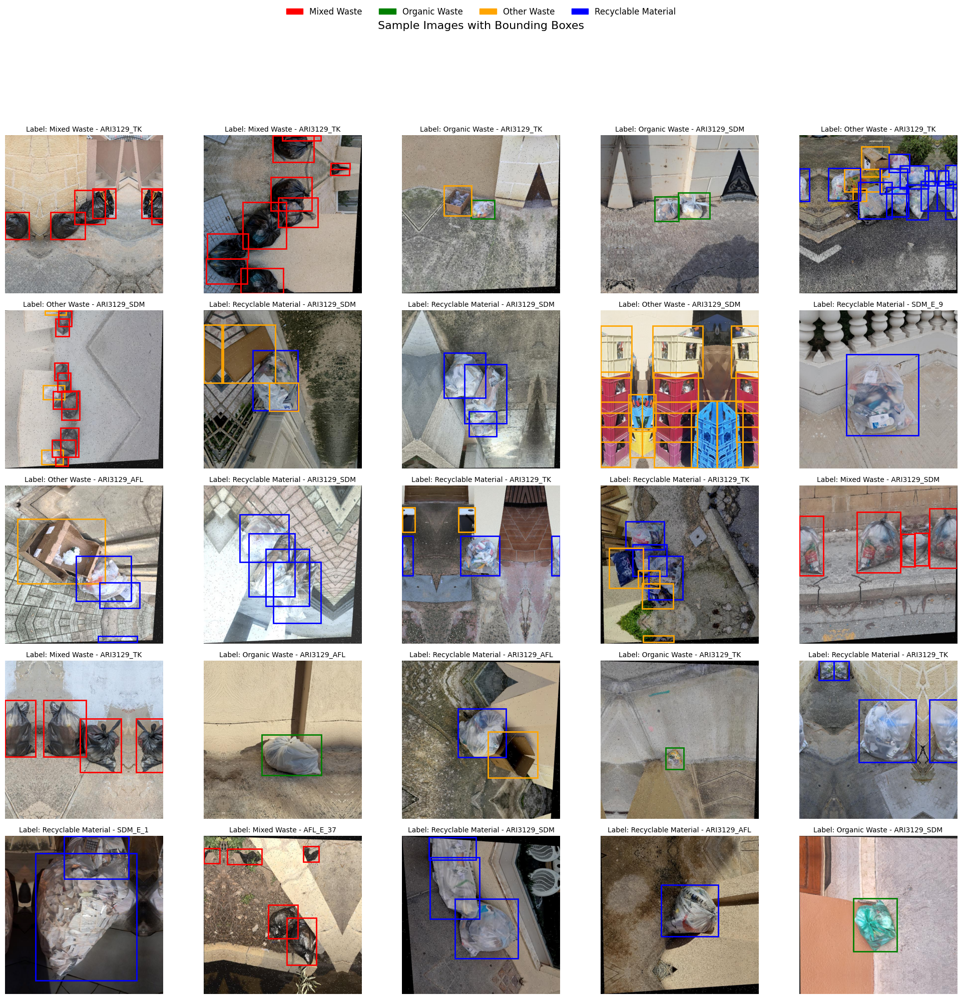

In [5]:
def visualize_random_images_with_bboxes(split="train", num_images=25):
    try:
        # Get image-label paths for the specified split
        files = get_image_and_label_paths(split)
        if not files:
            print(f"No files found in split: '{split}'.")
            return

        # Classify images by the presence of bounding boxes for each class
        class_to_files = {cls: [] for cls in CLASSES}
        for img_path, lbl_path in files:
            if os.path.exists(lbl_path):
                with open(lbl_path, "r") as f:
                    lines = f.readlines()
                    present_classes = {int(line.split()[0]) for line in lines}
                    for class_id in present_classes:
                        if class_id < len(CLASSES):
                            class_to_files[CLASSES[class_id]].append((img_path, lbl_path))

        # Select images: Ensure at least 2 per class, fill remaining slots randomly
        selected_files = []
        for cls, cls_files in class_to_files.items():
            selected_files.extend(random.sample(cls_files, min(2, len(cls_files))))

        remaining_slots = num_images - len(selected_files)
        if remaining_slots > 0:
            other_files = [f for f in files if f not in selected_files]
            selected_files.extend(random.sample(other_files, min(remaining_slots, len(other_files))))
    except Exception as e:
        print(f"Error fetching files for split '{split}': {e}")
        return

    # Function to process images with detailed naming
    def process_image(file_pair):
        img_path, lbl_path = file_pair
        try:
            # Read and convert the image
            bgr_img = cv2.imread(img_path)
            if bgr_img is None:
                return None, "Image not found", None

            rgb_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
            h, w, _ = rgb_img.shape

            # Extract AFL_E, SDM_E, Online_Number, or fallback to default naming
            file_name = os.path.basename(img_path)
            if "AFL_E" in file_name or "SDM_E" in file_name:
                parts = file_name.split("_")
                idx = [i for i, part in enumerate(parts) if part in {"AFL", "SDM"}]
                if idx and len(parts) > idx[0] + 2:
                    clean_name = f"{parts[idx[0]]}_{parts[idx[0] + 1]}_{parts[idx[0] + 2]}"
                else:
                    clean_name = "Unknown"
            elif "Online" in file_name:
                parts = file_name.split("_")
                clean_name = f"{parts[0]}_{parts[1]}"
            elif "AFL" in file_name or "SDM" in file_name or "TK" in file_name:
                parts = file_name.split("_")
                clean_name = f"{parts[0]}_{parts[1]}"
            else:
                clean_name = file_name

            # Determine label
            label = "No Label"
            if os.path.exists(lbl_path):
                with open(lbl_path, "r") as f:
                    label_lines = f.readlines()
                if label_lines:
                    class_id = int(label_lines[0].strip().split()[0])
                    label = CLASSES[class_id] if class_id < len(CLASSES) else "Unknown"

            return rgb_img, lbl_path, w, h, f"Label: {label} - {clean_name}"
        except Exception:
            return None, None, None, None, None

    # Parallel processing of images
    with ThreadPoolExecutor(max_workers=min(len(selected_files), os.cpu_count())) as executor:
        results = list(executor.map(process_image, selected_files))

    # Calculate grid size dynamically
    grid_size = int(num_images ** 0.5) + (1 if num_images ** 0.5 % 1 > 0 else 0)
    fig, axs = plt.subplots(grid_size, grid_size, figsize=(20, 20))
    axs = axs.flatten()

    # Class colors for bounding boxes
    class_colors = {
        "Mixed Waste": "red",
        "Organic Waste": "green",
        "Other Waste": "orange",
        "Recyclable Material": "blue"
    }

    for result, ax in zip(results, axs):
        rgb_img, lbl_path, img_w, img_h, clean_name = result
        if rgb_img is not None:
            ax.imshow(rgb_img)
            ax.axis("off")
            draw_yolo_bboxes(ax, lbl_path, img_w, img_h, class_colors)
            ax.set_title(clean_name, fontsize=10)
        else:
            ax.axis("off")
            ax.set_title("Error loading image", fontsize=10)

    # Hide unused subplots
    for ax in axs[len(results):]:
        ax.axis("off")

    # Add a legend for class colors
    legend_handles = [
        patches.Patch(color=color, label=f"{cls}")
        for cls, color in class_colors.items()
    ]
    plt.figlegend(handles=legend_handles, loc="upper center", ncol=4, frameon=False, fontsize=12)

    plt.suptitle("Sample Images with Bounding Boxes", fontsize=16, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()

visualize_random_images_with_bboxes(split="train", num_images=25)

## Dataset Statistics

## Dataset Statistics Generator

This script gathers statistics for a YOLO dataset, including the number of images, bounding boxes, and class distributions for each dataset split. The `process_file` function processes label files to count bounding boxes and classify occurrences per class. Using parallel processing, the `gather_statistics_parallel` function efficiently computes these metrics, displaying progress with a visual progress bar. The resulting statistics provide insights into dataset structure and class balance.


In [7]:
def process_file(label_path):
    try:
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
            box_count = len(lines)
            class_counts = {}
            for line in lines:
                class_id_str, *rest = line.strip().split()
                class_id = int(class_id_str)
                if 0 <= class_id < len(CLASSES):
                    class_counts[CLASSES[class_id]] = class_counts.get(CLASSES[class_id], 0) + 1
            return box_count, class_counts
    except Exception as e:
        print(f"Error processing file {label_path}: {e}")
    return 0, {}

def gather_statistics_parallel():
    stats = {split: {"images": 0, "boxes": 0} for split in SPLITS}
    stats["class_distribution"] = {cls_name: 0 for cls_name in CLASSES}

    for split in SPLITS:
        try:
            files = get_image_and_label_paths(split)
            stats[split]["images"] = len(files)

            with ThreadPoolExecutor() as executor:
                future_to_file = {executor.submit(process_file, label_path): label_path for _, label_path in files}
                for future in tqdm(as_completed(future_to_file), total=len(files), desc=f"Processing {split}"):
                    box_count, class_counts = future.result()
                    stats[split]["boxes"] += box_count
                    for cls, count in class_counts.items():
                        stats["class_distribution"][cls] += count
        except Exception as e:
            print(f"Error processing split '{split}': {e}")

    return stats

stats = gather_statistics_parallel()

Processing test: 100%|██████████| 34/34 [00:03<00:00,  8.82it/s]


### Dataset Completeness Checker

This script calculates and visualizes the completeness of a YOLO dataset by comparing the number of annotated images to the total number of images. The `dataset_completeness_text` function computes the percentage of annotated images and displays the statistics in text format. It also generates a bar chart with counts of annotated and unannotated images, providing a clear and visual representation of dataset completeness.


DATASET COMPLETENESS
Total Images: 852
Annotated Images: 852
Unannotated Images: 0
Completeness: 100.0%



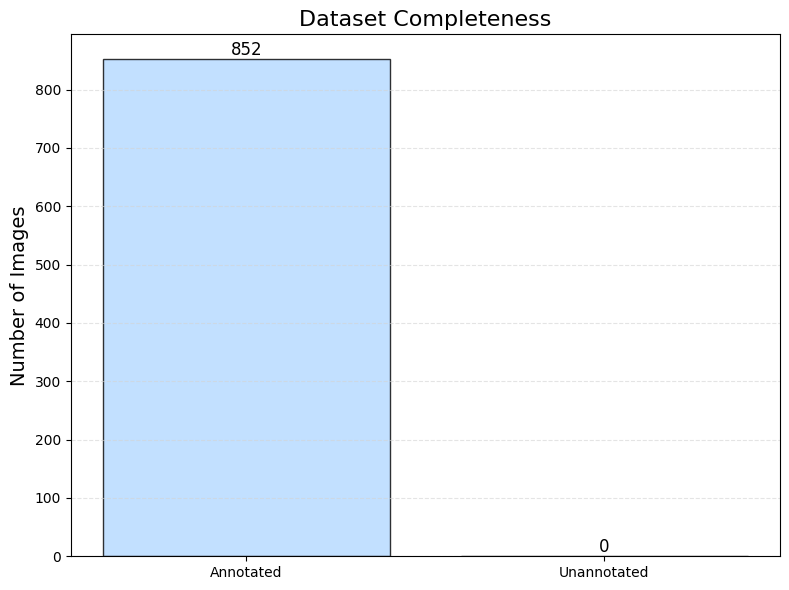

In [8]:
def dataset_completeness_text(stats):
    splits = ["train", "valid", "test"]

    # Calculate annotated and total images
    annotated_images = sum(stats[split]["images"] for split in splits)
    total_images = annotated_images + sum(stats[split].get("unannotated", 0) for split in splits)

    # Handle edge case where total_images is zero
    if total_images == 0:
        print("No images found in the dataset.")
        return

    completeness_percentage = 100 * annotated_images / total_images

    # Display text statistics
    print("\nDATASET COMPLETENESS")
    print("====================")
    print(f"Total Images: {total_images}")
    time.sleep(0.5)
    print(f"Annotated Images: {annotated_images}")
    time.sleep(0.5)
    print(f"Unannotated Images: {total_images - annotated_images}")
    time.sleep(0.5)
    print(f"Completeness: {completeness_percentage:.1f}%\n")

    # Bar chart visualization
    plt.figure(figsize=(8, 6))
    labels = ["Annotated", "Unannotated"]
    values = [annotated_images, total_images - annotated_images]
    colors = ["#B3D9FF", "#FFC2C7"]  # Lighter pastel blue and pink

    bars = plt.bar(labels, values, color=colors, edgecolor="black", alpha=0.8)
    
    # Add values above bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f"{int(height)}", ha="center", va="bottom", fontsize=12)

    # Customize the chart
    plt.title("Dataset Completeness", fontsize=16)
    plt.ylabel("Number of Images", fontsize=14)
    plt.grid(axis="y", linestyle="--", alpha=0.6, color="#D3D3D3")
    plt.tight_layout()
    plt.show()
    
dataset_completeness_text(stats)

### Class Distribution Visualizer

This script visualizes the class distribution of a YOLO dataset across all splits. The `plot_class_distribution` function displays class counts as text and generates a bar chart with pastel-colored bars representing each class. It includes numeric labels on bars and a legend for color-class mapping, providing a clear overview of dataset balance.


Class Distribution (across ALL splits):
  Mixed Waste: 945
  Organic Waste: 740
  Other Waste: 563
  Recyclable Material: 801


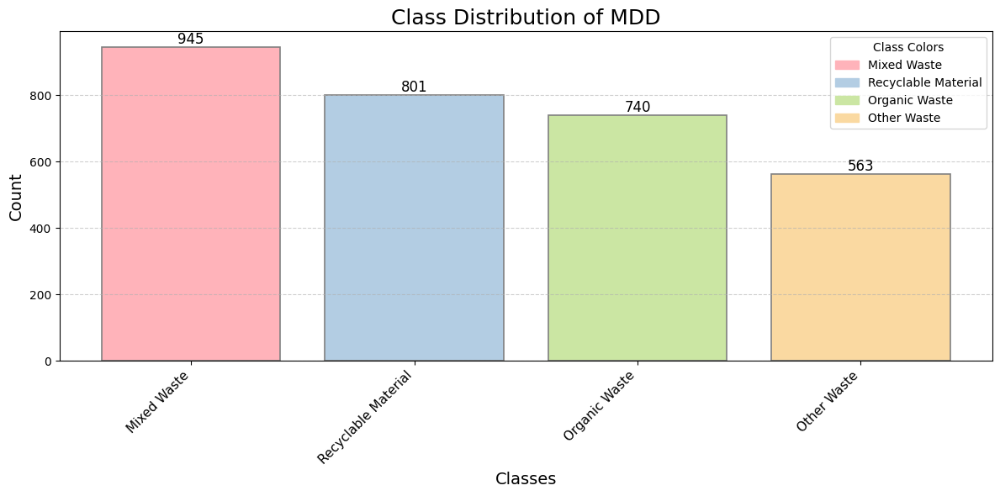

In [9]:
def plot_class_distribution(class_distribution):
    # Display class distribution as text
    print("\nClass Distribution (across ALL splits):")
    for cls_name, count in stats["class_distribution"].items():
        time.sleep(0.5)
        print(f"  {cls_name}: {count}")

    # Sort class distribution in descending order
    sorted_classes = sorted(class_distribution.items(), key=lambda x: x[1], reverse=True)
    class_names, counts = zip(*sorted_classes)

    # Define pastel colors for each class
    colors = {
        "Mixed Waste": "#FFB3BA",   # Soft pastel red
        "Recyclable Material": "#B3CDE3",  # Soft pastel blue
        "Organic Waste": "#CBE6A3",  # Soft pastel green
        "Other Waste": "#FAD9A1"    # Soft pastel orange
    }
    bar_colors = [colors.get(cls_name, "#D3D3D3") for cls_name in class_names]

    # Create the bar chart
    plt.figure(figsize=(12, 6))
    bars = plt.bar(class_names, counts, color=bar_colors, edgecolor="gray", linewidth=1.2)
    plt.xticks(rotation=45, ha="right", fontsize=11)
    plt.title("Class Distribution of MDD", fontsize=18)
    plt.xlabel("Classes", fontsize=14)
    plt.ylabel("Count", fontsize=14)

    # Add numeric labels above each bar
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.3,
            f"{int(height)}",
            ha="center",
            va="bottom",
            fontsize=12,
            color="black"
        )

    # Add a legend for colors
    plt.legend(
        handles=[plt.Rectangle((0, 0), 1, 1, color=color) for color in colors.values()],
        labels=colors.keys(),
        title="Class Colors",
        loc="upper right",
        fontsize=10
    )

    # Adjust layout for aesthetics
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()

plot_class_distribution(stats["class_distribution"])

### Class Dominance Pie Chart

This script visualizes the dominance of different classes in a YOLO dataset using a pie chart. The `class_dominance_pie_chart` function computes the proportion of each class and represents it with custom pastel colors. The chart includes percentage labels for each class, providing a quick and clear understanding of class distribution within the dataset.

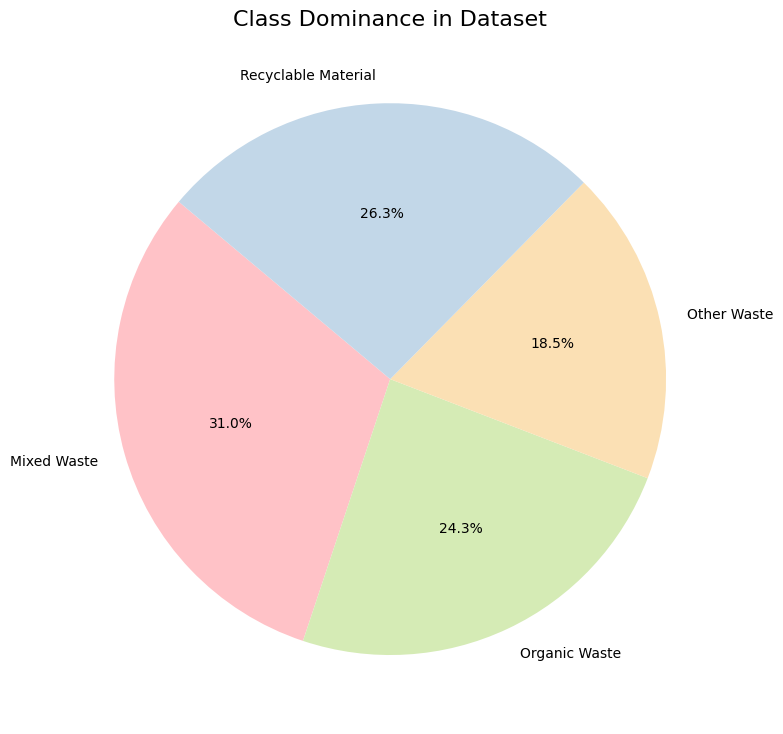

In [10]:
def class_dominance_pie_chart(stats):
    class_counts = stats["class_distribution"]
    labels = list(class_counts.keys())
    sizes = list(class_counts.values())

    # Define custom colors for each class
    colors = {
        "Mixed Waste": "#FFC2C7",       # Pastel pink
        "Organic Waste": "#D5EBB5",    # Pastel green
        "Recyclable Material": "#C2D7E8",  # Pastel blue
        "Other Waste": "#FBE0B4"       # Pastel orange
    }
    pie_colors = [colors[label] for label in labels]

    # Plot pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=labels, autopct="%1.1f%%", startangle=140, colors=pie_colors)
    plt.title("Class Dominance in Dataset", fontsize=16)
    plt.tight_layout()
    plt.show()
    
class_dominance_pie_chart(stats)

### Annotation Completeness by Class

This script analyzes and visualizes the annotation completeness for each class in a YOLO dataset split (default: `train`). The `annotation_completeness_by_class` function counts the number of images annotated for each class and displays the data as a bar chart with custom pastel colors. The chart includes numeric labels above bars and grid lines for clarity, providing insights into the presence of annotations for different classes in the dataset.

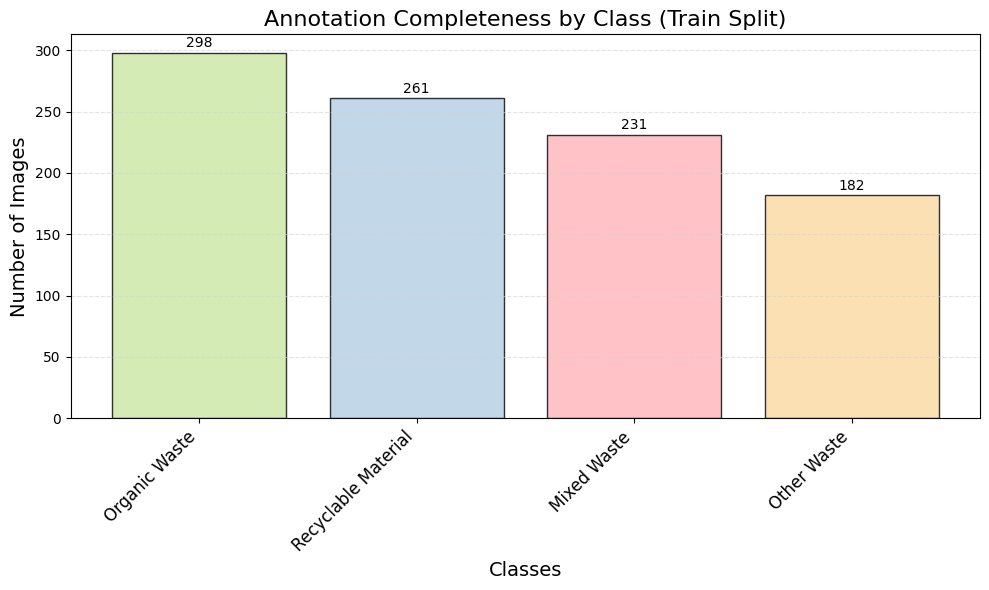

In [11]:
def annotation_completeness_by_class(stats, split="train"):
    files = get_image_and_label_paths(split)
    if not files:
        print(f"No files found in split: '{split}'.")
        return

    class_presence = {cls: 0 for cls in CLASSES}

    for _, lbl_path in files:
        if not os.path.exists(lbl_path):
            continue

        with open(lbl_path, "r") as f:
            lines = f.readlines()
            present_classes = {int(line.split()[0]) for line in lines}
            for cls_id in present_classes:
                class_presence[CLASSES[cls_id]] += 1

    # Sort classes by presence (most to least)
    sorted_classes = sorted(class_presence.items(), key=lambda item: item[1], reverse=True)
    class_names, counts = zip(*sorted_classes)

    # Define colors for each class
    colors = {
        "Mixed Waste": "#FFB3BA",       # Pastel pink
        "Recyclable Material": "#B3CDE3",  # Pastel blue
        "Organic Waste": "#CBE6A3",    # Pastel green
        "Other Waste": "#FAD9A1"       # Pastel orange
    }
    bar_colors = [colors[cls] for cls in class_names]

    # Plot bar chart
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, counts, color=bar_colors, edgecolor="black", alpha=0.8)

    # Add actual numbers on top of each bar
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 2, f"{int(height)}", ha="center", va="bottom", fontsize=10)

    # Add lighter grey horizontal grid lines
    plt.grid(axis="y", linestyle="--", color="#D3D3D3", alpha=0.6)  # Light grey color

    plt.xticks(rotation=45, ha="right", fontsize=12)
    plt.title(f"Annotation Completeness by Class ({split.capitalize()} Split)", fontsize=16)
    plt.xlabel("Classes", fontsize=14)
    plt.ylabel("Number of Images", fontsize=14)
    plt.tight_layout()
    plt.show()

annotation_completeness_by_class(stats, split="train")

### Dataset Statistics Overview

This script summarizes and visualizes key statistics for a YOLO dataset. The `display_statistics` function calculates the total number of bounding boxes and images, presenting them in a bar chart. It also displays statistics for each dataset split (`train`, `valid`, `test`) and visualizes bounding box and image counts by split using a grouped bar chart. Numeric labels and grid lines enhance readability, providing a comprehensive view of the dataset's structure.


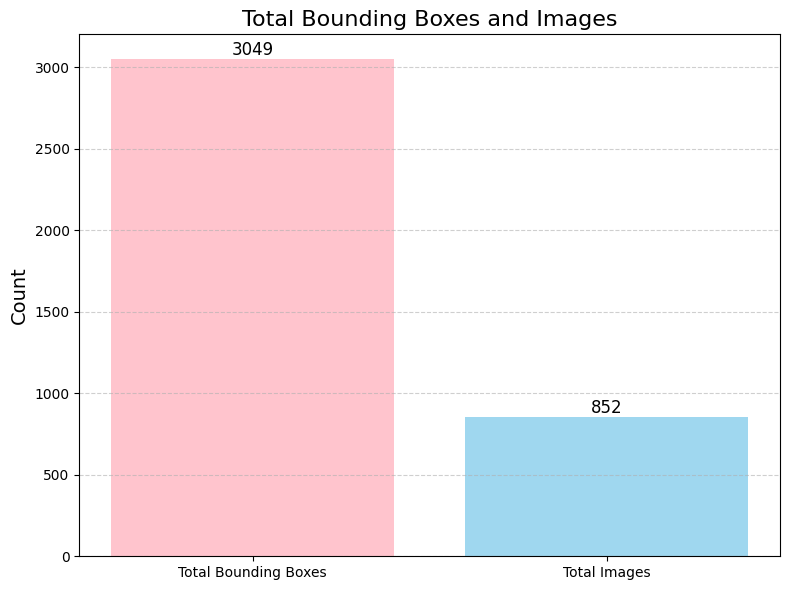


DATASET STATISTICS BY SPLIT:
  Train:
    - Bounding Boxes: 2686
    - Images: 748
  Valid:
    - Bounding Boxes: 228
    - Images: 70
  Test:
    - Bounding Boxes: 135
    - Images: 34


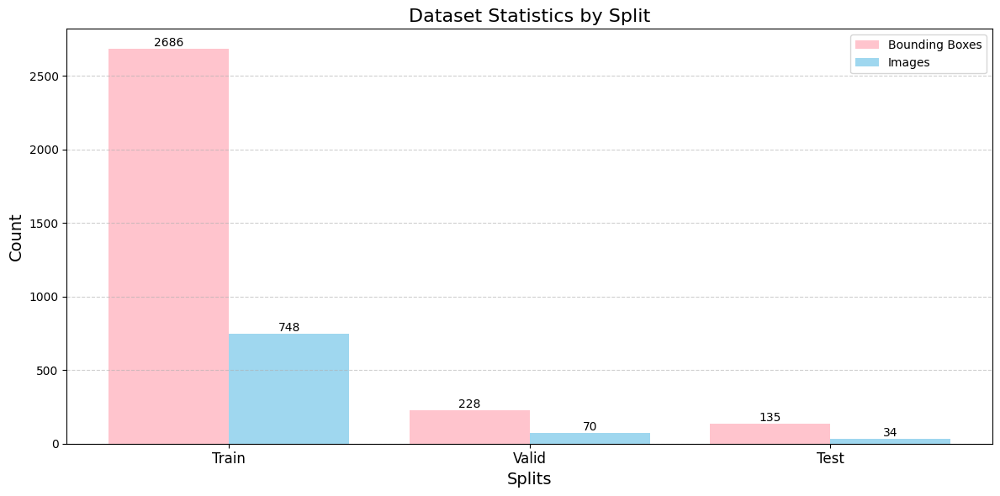

In [12]:
def display_statistics(stats):
    # Calculate total bounding boxes and images
    splits = list(stats.keys())
    splits.remove("class_distribution")  # Exclude class distribution from split stats
    boxes = [stats[split]["boxes"] for split in splits]
    images = [stats[split]["images"] for split in splits]
    total_boxes = sum(boxes)
    total_images = sum(images)

    # Bar graph for total bounding boxes and images
    plt.figure(figsize=(8, 6))
    plt.bar(["Total Bounding Boxes", "Total Images"], [total_boxes, total_images], color=["#FFB6C1", "#87CEEB"], alpha=0.8)

    # Add counts on top of the bars
    plt.text(0, total_boxes + 0.5, str(total_boxes), ha="center", va="bottom", fontsize=12)
    plt.text(1, total_images + 0.5, str(total_images), ha="center", va="bottom", fontsize=12)

    # Customize the chart
    plt.title("Total Bounding Boxes and Images", fontsize=16)
    plt.ylabel("Count", fontsize=14)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()

    # Display dataset statistics by split in text
    print("\nDATASET STATISTICS BY SPLIT:")
    for split in stats.keys():
        time.sleep(0.5)
        if split != "class_distribution":
            print(f"  {split.capitalize()}:")
            print(f"    - Bounding Boxes: {stats[split]['boxes']}")
            print(f"    - Images: {stats[split]['images']}")

    # Create bar chart for split statistics (Bounding Boxes and Images)
    x = range(len(splits))

    plt.figure(figsize=(12, 6))
    plt.bar([i - 0.2 for i in x], boxes, width=0.4, label="Bounding Boxes", align="center", alpha=0.8, color="#FFB6C1")  # Slightly darker pastel pink
    plt.bar([i + 0.2 for i in x], images, width=0.4, label="Images", align="center", alpha=0.8, color="#87CEEB")  # Slightly darker pastel blue

    # Add the counts on top of each bar
    for i, (box, image) in enumerate(zip(boxes, images)):
        plt.text(i - 0.2, box + 0.5, str(box), ha="center", va="bottom", fontsize=10)
        plt.text(i + 0.2, image + 0.5, str(image), ha="center", va="bottom", fontsize=10)

    # Customizing the chart
    plt.xticks(x, [split.capitalize() for split in splits], fontsize=12)
    plt.title("Dataset Statistics by Split", fontsize=16)
    plt.xlabel("Splits", fontsize=14)
    plt.ylabel("Count", fontsize=14)
    plt.legend()
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()

display_statistics(stats)

### Object Count Histogram

This script visualizes the distribution of object counts per image in a YOLO dataset split (default: `train`). The `object_count_histogram` function calculates the number of objects annotated in each image using parallel processing for efficiency. It generates a histogram with dynamically determined bins, labeled bars, and a grid for clarity. This visualization provides insights into the density and frequency of objects in the dataset.

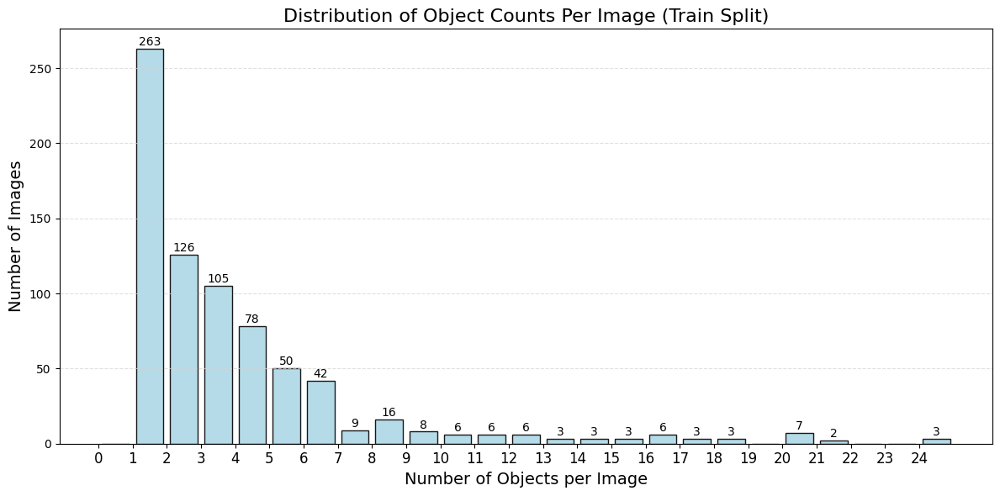

In [13]:
def object_count_histogram(stats, split="train"):
    files = get_image_and_label_paths(split)
    if not files:
        print(f"No files found in split: '{split}'.")
        return

    # Function to count lines in a label file
    def count_objects(lbl_path):
        if not os.path.exists(lbl_path):
            return 0
        with open(lbl_path, "r") as f:
            return len(f.readlines())

    # Use ThreadPoolExecutor for parallel processing
    with concurrent.futures.ThreadPoolExecutor() as executor:
        object_counts = list(executor.map(lambda file: count_objects(file[1]), files))

    # Calculate the bin range dynamically for better distribution
    max_objects = max(object_counts) if object_counts else 1
    bins = range(0, max_objects + 2, 1)  # Bin for each count from 0 to max_objects

    plt.figure(figsize=(12, 6))
    plt.hist(object_counts, bins=bins, color="#ADD8E6", edgecolor="black", alpha=0.9, rwidth=0.8)  # Light pastel blue

    # Add labels to each bar for better clarity
    counts, bin_edges = np.histogram(object_counts, bins=bins)
    for i, count in enumerate(counts):
        if count > 0:
            plt.text(
                bin_edges[i] + 0.5, 
                count + 0.5, 
                str(count), 
                ha="center", 
                va="bottom", 
                fontsize=10
            )

    # Aesthetic and descriptive customizations
    plt.title(f"Distribution of Object Counts Per Image ({split.capitalize()} Split)", fontsize=16)
    plt.xlabel("Number of Objects per Image", fontsize=14)
    plt.ylabel("Number of Images", fontsize=14)
    plt.xticks(ticks=range(0, max_objects + 1, 1), fontsize=12)  # X-axis ticks for every 1
    plt.grid(axis="y", linestyle="--", color="#D3D3D3", alpha=0.7)
    plt.tight_layout()
    plt.show()

object_count_histogram(stats, split="train")

### Annotation Density Heatmap

This script visualizes the spatial density of annotations in a YOLO dataset using a heatmap. The `density_heatmap` function normalizes annotation coordinates across the image grid and aggregates their positions into a density map. It supports individual splits (`train`, `valid`, `test`) or a combined view of all splits. The heatmap provides a clear representation of annotation concentration, highlighting areas of higher object density within the dataset.

Generating heatmap for the train split...


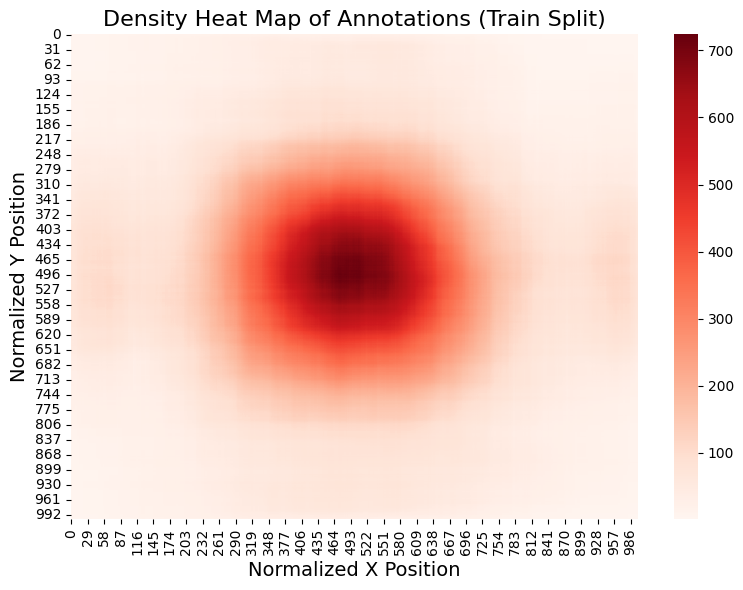

Generating heatmap for the valid split...


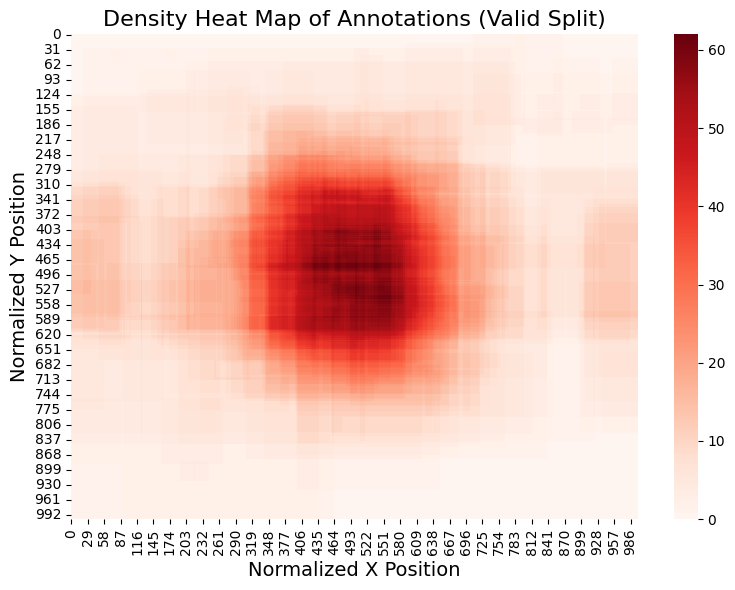

Generating heatmap for the test split...


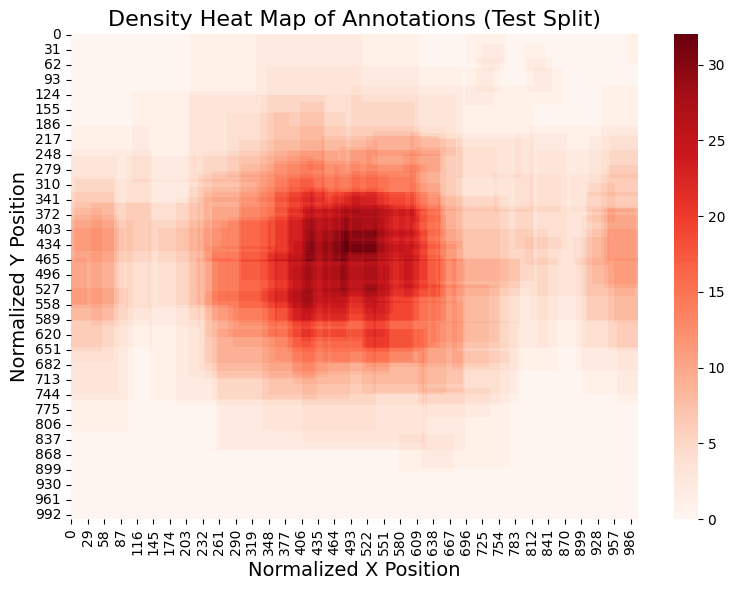

Generating combined heatmap for all splits...


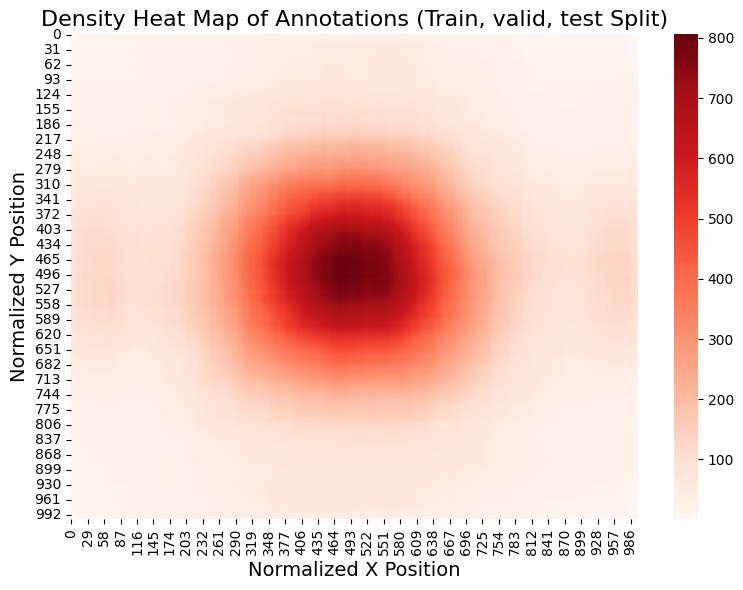

In [14]:
def density_heatmap(stats, split=None):
    splits = ["train", "valid", "test"] if split is None else [split]
    heatmap = np.zeros((1000, 1000))  # Normalized grid

    for split in splits:
        files = get_image_and_label_paths(split)
        if not files:
            print(f"No files found in split: '{split}'.")
            continue

        for _, lbl_path in files:
            if not os.path.exists(lbl_path):
                continue

            with open(lbl_path, "r") as f:
                lines = f.readlines()
            for line in lines:
                _, x_center, y_center, width, height = map(float, line.strip().split())
                x_min = int((x_center - width / 2) * 1000)
                x_max = int((x_center + width / 2) * 1000)
                y_min = int((y_center - height / 2) * 1000)
                y_max = int((y_center + height / 2) * 1000)
                heatmap[y_min:y_max, x_min:x_max] += 1

    split_title = "All Splits" if split is None else f"{', '.join(splits).capitalize()} Split"
    plt.figure(figsize=(8, 6))
    sns.heatmap(heatmap, cmap="Reds", cbar=True)
    plt.title(f"Density Heat Map of Annotations ({split_title})", fontsize=16)
    plt.xlabel("Normalized X Position", fontsize=14)
    plt.ylabel("Normalized Y Position", fontsize=14)
    plt.tight_layout()
    plt.show()

print("Generating heatmap for the train split...")
density_heatmap(stats, split="train")
time.sleep(0.5)

print("Generating heatmap for the valid split...")
density_heatmap(stats, split="valid")
time.sleep(0.5)

print("Generating heatmap for the test split...")
density_heatmap(stats, split="test")
time.sleep(0.5)

print("Generating combined heatmap for all splits...")
density_heatmap(stats, split=None)

### Class Co-occurrence Matrix

This script computes and visualizes the co-occurrence of classes within images in a YOLO dataset split (default: `train`). The `class_cooccurrence_matrix` function generates a matrix showing how often classes appear together in the same image. The matrix is visualized as a heatmap with annotated counts, using a color gradient to highlight co-occurrence frequency. This visualization helps identify relationships and patterns among classes in the dataset.

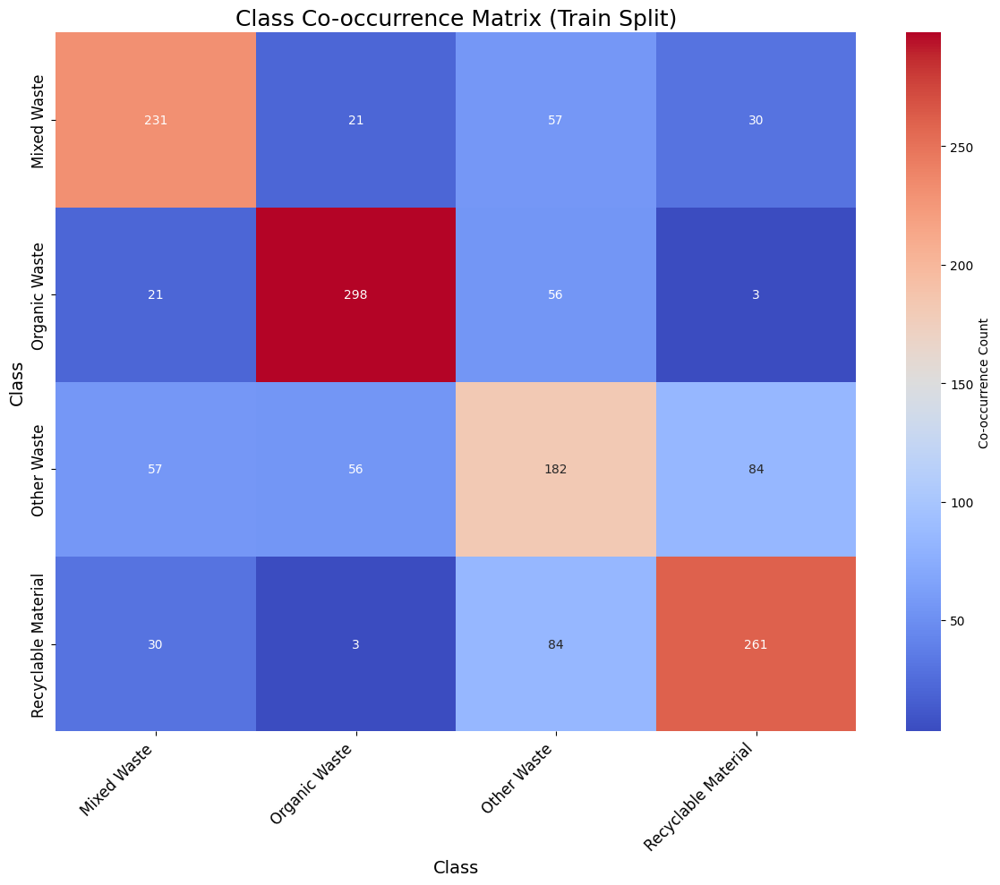

In [15]:
def class_cooccurrence_matrix(stats, split="train"):
    files = get_image_and_label_paths(split)
    if not files:
        print(f"No files found in split: '{split}'.")
        return

    # Initialize co-occurrence matrix
    cooccurrence = np.zeros((len(CLASSES), len(CLASSES)), dtype=int)

    for _, lbl_path in files:
        if not os.path.exists(lbl_path):
            continue

        with open(lbl_path, "r") as f:
            lines = f.readlines()
        present_classes = {int(line.split()[0]) for line in lines}

        # Update co-occurrence matrix
        for cls1 in present_classes:
            for cls2 in present_classes:
                cooccurrence[cls1, cls2] += 1

    # Create heatmap with enhanced visualization
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        cooccurrence,
        annot=True,
        fmt="d",
        cmap="coolwarm",
        xticklabels=CLASSES,
        yticklabels=CLASSES,
        cbar_kws={"label": "Co-occurrence Count"}
    )
    plt.title(f"Class Co-occurrence Matrix ({split.capitalize()} Split)", fontsize=18)
    plt.xlabel("Class", fontsize=14)
    plt.ylabel("Class", fontsize=14)
    plt.xticks(rotation=45, ha="right", fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

class_cooccurrence_matrix(stats, split="train")